In [44]:
from moviepy.editor import VideoFileClip
from IPython.display import Audio, display
import torchaudio
import torch
import numpy as np

In [45]:
clip = VideoFileClip("/home/and/projects/OWN/emotion-recognition-app/outputs/2022-05-24/18-39-34/result.mp4")

In [46]:
clip.size

[1200, 1000]

In [47]:
clip.ipython_display(autoplay=True)


Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [9]:
audio = clip.audio

audio_array = audio.to_soundarray()

In [12]:
audio_array.shape

(746172, 2)

In [13]:
audio.write_audiofile("/home/and/projects/OWN/emotion-recognition-app/data/audio.wav")

MoviePy - Writing audio in /home/and/projects/OWN/emotion-recognition-app/data/audio.wav


MoviePy - Done.


In [16]:

t_audio, sr = torchaudio.load("/home/and/projects/OWN/emotion-recognition-app/data/audio.wav")

In [17]:
t_audio.shape

torch.Size([2, 746172])

In [18]:
sr

44100

In [25]:
audio_array.T

array([[ 0.        ,  0.        ,  0.        , ..., -0.006073  ,
        -0.00421143, -0.00344849],
       [ 0.        ,  0.        ,  0.        , ..., -0.00894165,
        -0.01394653, -0.01367188]])

In [20]:
t_audio

tensor([[ 0.0000,  0.0000,  0.0000,  ..., -0.0040, -0.0042, -0.0043],
        [ 0.0000,  0.0000,  0.0000,  ..., -0.0034, -0.0045, -0.0056]])

In [28]:
def play_audio(waveform, sample_rate):
    if isinstance(waveform, torch.Tensor):
        waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape
    if num_channels == 1:
        display(Audio(waveform[0], rate=sample_rate))
    elif num_channels == 2:
        display(Audio((waveform[0], waveform[1]), rate=sample_rate))
    else:
        raise ValueError("Waveform with more than 2 channels are not supported.")


In [29]:
play_audio(t_audio, sr)

In [30]:
play_audio(audio_array.T, sr)

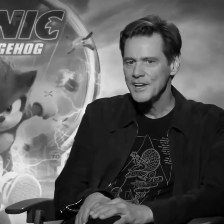

In [4]:
from PIL import Image
import cv2
frame = clip.get_frame(0)
Image.fromarray(cv2.cvtColor(cv2.resize(frame, (224, 224)), cv2.COLOR_RGB2GRAY))

In [5]:
gray = cv2.cvtColor(cv2.resize(frame, (224, 224)), cv2.COLOR_RGB2GRAY)

In [8]:
def mono_to_stereo(
    x, axis=0
):
    if x.shape[axis] == 1:
        new_shape = list(x.shape)
        new_shape[axis] = 3
        if isinstance(x, np.ndarray):
            return np.stack([x, x, x], axis=axis).reshape(new_shape)
        elif isinstance(x, torch.Tensor):
            return torch.stack([x, x, x], dim=axis).reshape(new_shape)
    return x

img = torch.from_numpy(mono_to_stereo(gray[None]))

In [9]:
torch.stack([img, img]).shape

torch.Size([2, 3, 224, 224])

In [10]:
import torch.nn.functional as F

pred = torch.empty((2, 7))
pred

tensor([[-9.1530e+11,  4.5691e-41, -9.1520e+11,  4.5691e-41, -9.1525e+11,
          4.5691e-41, -9.1531e+11],
        [ 4.5691e-41, -9.1520e+11,  4.5691e-41, -9.1532e+11,  4.5691e-41,
         -1.7335e+12,  4.5691e-41]])

In [13]:
F.softmax(pred, dim=1)

tensor([[0.0000, 0.3333, 0.0000, 0.3333, 0.0000, 0.3333, 0.0000],
        [0.2500, 0.0000, 0.2500, 0.0000, 0.2500, 0.0000, 0.2500]])

0
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



t:  10%|██████▌                                                           | 4/40 [00:00<00:01, 30.60it/s, now=None]

0.0
0.05
0.1
0.15000000000000002
0.2


t:  20%|█████████████▏                                                    | 8/40 [00:00<00:01, 22.13it/s, now=None]

0.25
0.30000000000000004
0.35000000000000003
0.4


t:  28%|█████████████████▉                                               | 11/40 [00:00<00:01, 22.30it/s, now=None]

0.45
0.5
0.55
0.6000000000000001


t:  35%|██████████████████████▊                                          | 14/40 [00:00<00:01, 22.83it/s, now=None]

0.65


t:  42%|███████████████████████████▋                                     | 17/40 [00:00<00:01, 22.91it/s, now=None]

0.7000000000000001
0.75
0.8
0.8500000000000001


t:  50%|████████████████████████████████▌                                | 20/40 [00:00<00:00, 22.96it/s, now=None]

0.9
0.9500000000000001


t:  57%|█████████████████████████████████████▍                           | 23/40 [00:00<00:00, 23.08it/s, now=None]

1.0
1.05
1.1
1.1500000000000001
1.2000000000000002


t:  65%|██████████████████████████████████████████▎                      | 26/40 [00:01<00:00, 23.09it/s, now=None]

1.25
1.3
1.35


t:  72%|███████████████████████████████████████████████▏                 | 29/40 [00:01<00:00, 23.09it/s, now=None]

1.4000000000000001
1.4500000000000002


t:  80%|████████████████████████████████████████████████████             | 32/40 [00:01<00:00, 23.10it/s, now=None]

1.5
1.55
1.6


t:  88%|████████████████████████████████████████████████████████▉        | 35/40 [00:01<00:00, 23.22it/s, now=None]

1.6500000000000001
1.7000000000000002


t:  95%|█████████████████████████████████████████████████████████████▊   | 38/40 [00:01<00:00, 23.20it/s, now=None]

1.75
1.8
1.85


1.9000000000000001
1.9500000000000002
Moviepy - Done !
Moviepy - video ready __temp__.mp4


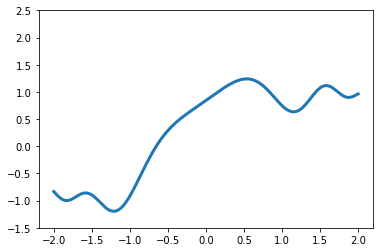

In [9]:
import matplotlib.pyplot as plt
import numpy as np
from moviepy.editor import VideoClip
from moviepy.video.io.bindings import mplfig_to_npimage

x = np.linspace(-2, 2, 200)

duration = 2

fig, ax = plt.subplots()
def make_frame(t):
    print(t)
    ax.clear()
    ax.plot(x, np.sinc(x**2) + np.sin(x + 2*np.pi/duration * t), lw=3)
    ax.set_ylim(-1.5, 2.5)
    return mplfig_to_npimage(fig)

animation = VideoClip(make_frame, duration=duration)
animation.ipython_display(fps=20, loop=True, autoplay=True)